## Fuente y Limpieza de datos

In [48]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns


In [49]:
df = pd.read_csv("../data/raw/winequality-red.csv", sep=',')

In [50]:
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [51]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

In [52]:
df.duplicated().sum()

np.int64(240)

In [53]:
df = df.drop_duplicates()

In [54]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 138.0 KB


In [55]:
df['quality_label'] = df['quality'].apply(lambda q: 'baja' if q<=5 else ('media' if q==6 else 'alta'))

C:\Users\inaki\AppData\Local\Temp\ipykernel_2948\3838522152.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['quality_label'] = df['quality'].apply(lambda q: 'baja' if q<=5 else ('media' if q==6 else 'alta'))


In [56]:
df["quality_label"].value_counts()

quality_label
baja     640
media    535
alta     184
Name: count, dtype: int64

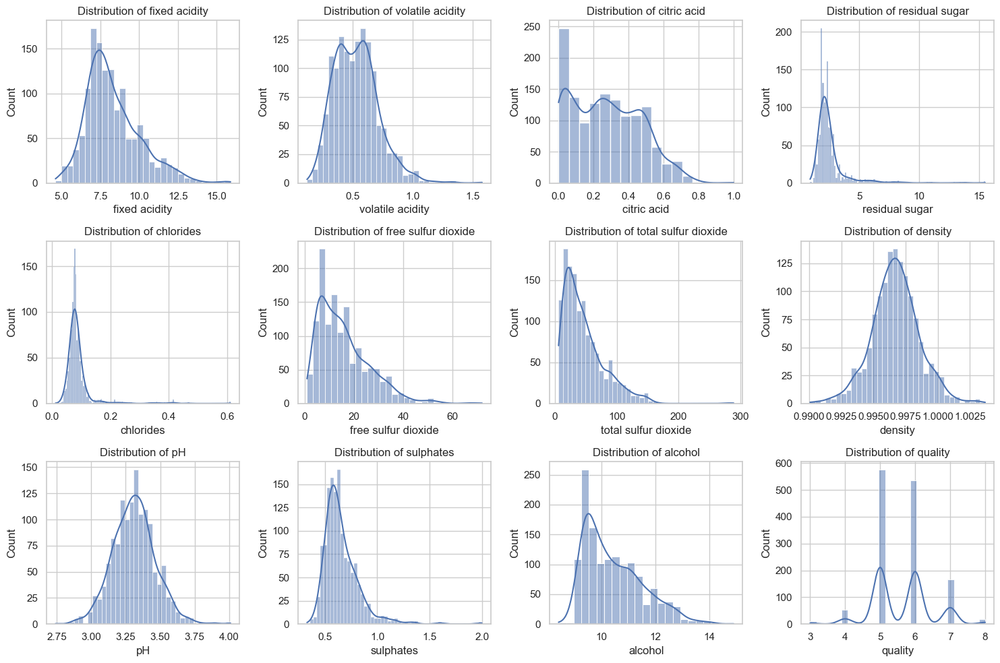

In [57]:
# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Graficar histogramas para cada característica
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns[:-1], 1): 
    plt.subplot(3, 4, i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

In [58]:
df['quality_label']= df['quality_label'].astype('string')

C:\Users\inaki\AppData\Local\Temp\ipykernel_2948\2477597259.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['quality_label']= df['quality_label'].astype('string')


In [59]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 13 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   residual sugar        1359 non-null   float64
 4   chlorides             1359 non-null   float64
 5   free sulfur dioxide   1359 non-null   float64
 6   total sulfur dioxide  1359 non-null   float64
 7   density               1359 non-null   float64
 8   pH                    1359 non-null   float64
 9   sulphates             1359 non-null   float64
 10  alcohol               1359 non-null   float64
 11  quality               1359 non-null   int64  
 12  quality_label         1359 non-null   string 
dtypes: float64(11), int64(1), string(1)
memory usage: 148.6 KB


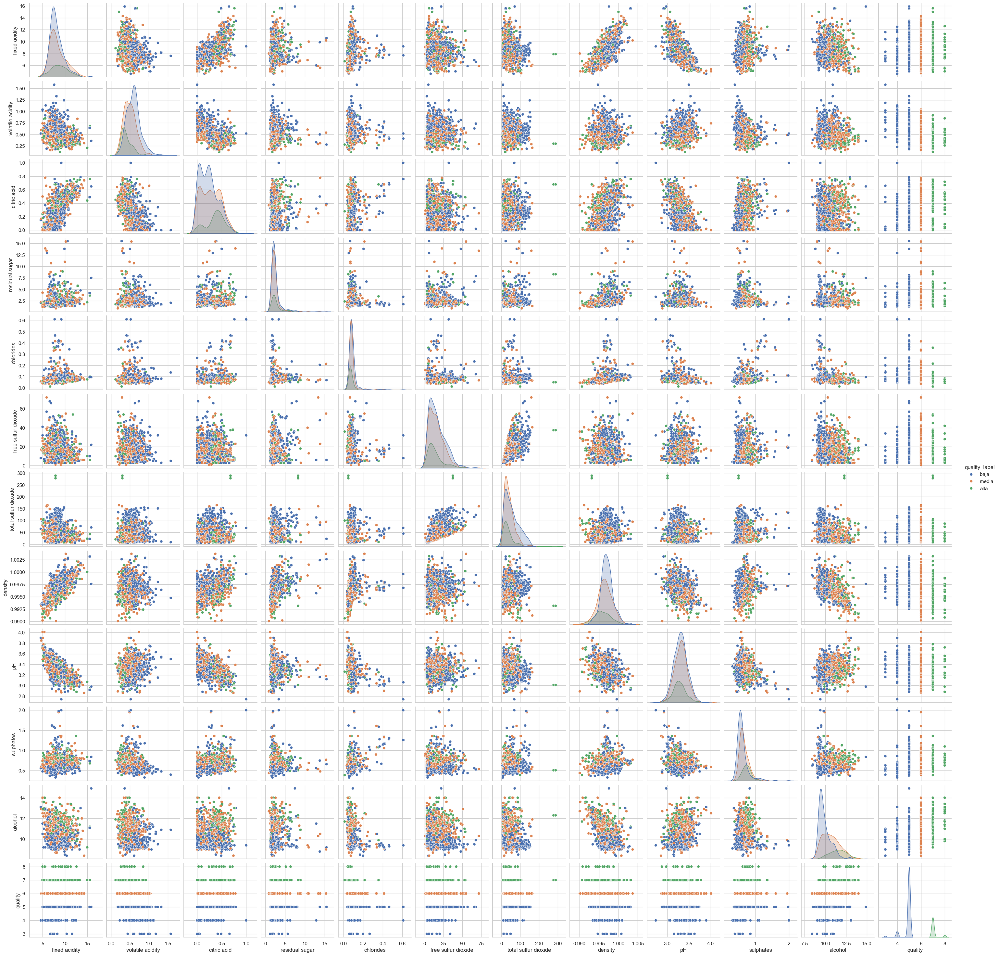

In [60]:
sns.pairplot(df,hue='quality_label')

In [61]:
# relación entre el alcohol y la acidez volátil.

df['alcohol_to_volatile_acidity'] = df['alcohol'] / df['volatile acidity']

# relacion entre el pH y la densidad

df['ph_to_density'] = df['pH'] / df['density']

C:\Users\inaki\AppData\Local\Temp\ipykernel_2948\325945320.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['alcohol_to_volatile_acidity'] = df['alcohol'] / df['volatile acidity']
C:\Users\inaki\AppData\Local\Temp\ipykernel_2948\325945320.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['ph_to_density'] = df['pH'] / df['density']


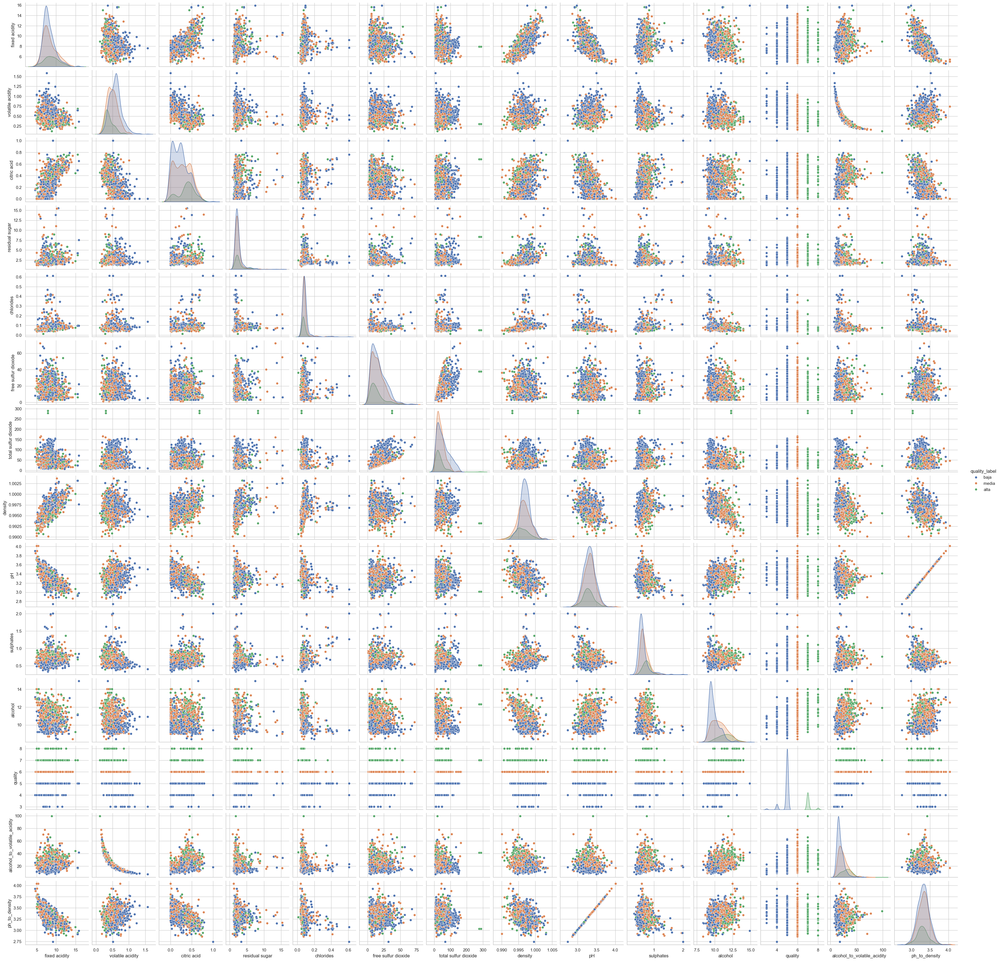

In [62]:
sns.pairplot(df,hue='quality_label')

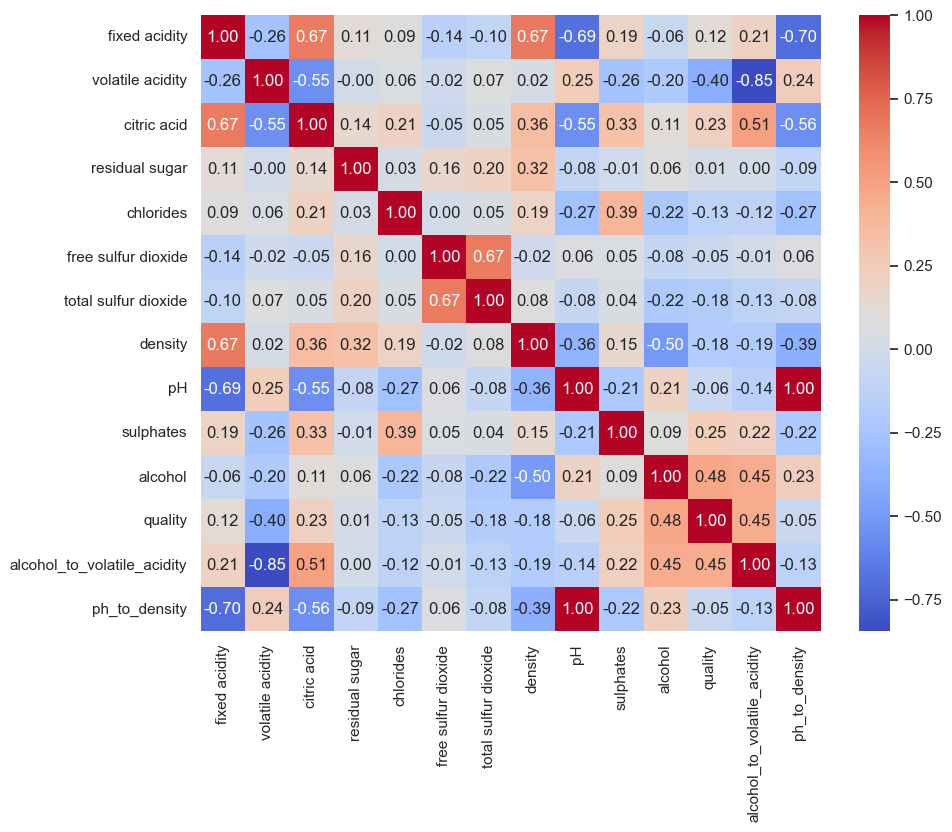

In [63]:
# Seleccionamos solo las columnas numéricas
numeric_cols = df.select_dtypes(include='number').columns

# Heatmap de la correlación solo con las columnas numéricas
plt.figure(figsize=(10, 8))
sns.heatmap(df[numeric_cols].corr(), annot=True, cmap='coolwarm', fmt='.2f')
plt.show()


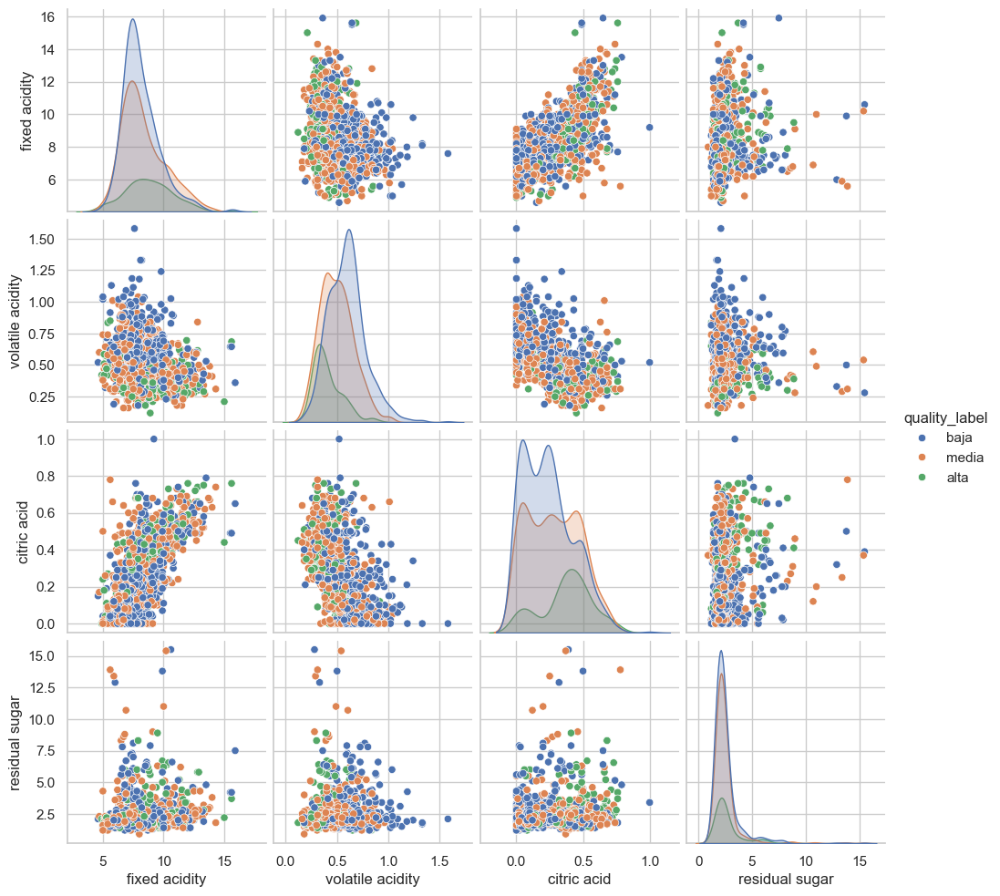

In [64]:
# Ejemplo de selección de columnas relevantes para el pairplot
selected_cols = ['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar', 'quality_label']

# Pairplot de las columnas seleccionadas
sns.pairplot(df[selected_cols], hue='quality_label')
plt.show()


Tras este estudio continuaremos guardaremos un nuevo .csv con las columnas que nos van  interesar para predecir la calidad del vino.

En princpio contamos con estas columnas:

fixed acidity: Acidez fija.  
volatile acidity: Acidez volátil.  
citric acid: Ácido cítrico.  
residual sugar: Azúcar residual.  
chlorides: Cloruros.  
free sulfur dioxide: Dióxido de azufre libre.  
total sulfur dioxide: Dióxido de azufre total.  
density: Densidad.  
pH: Nivel de pH.  
sulphates: Sulfatos.  
alcohol: Contenido de alcohol.  
quality: Calidad del vino (variable objetivo).  

e incluimos las siguientes:

quality label: Etiqueta que utilizaremos para catalogar el vino.  
    'baja' si la calidad(q) q<=5   
    'media' si la calidad (q) q==6  
    sino la calidad sera 'alta'.  

Hemos probado a generar nuevas columnas para ver si podiamos extraer una nueva variable de los datos que teniamos, pero no ha sido posible.

Así que considerando los datos que tenemos asi como el tiempo del que disponemos, intentaremos predecir la calidad del vino on las siguientes columnas:

fixed acidity: Acidez fija.  +0.12  
volatile acidity: Acidez volátil.  -0.40  
citric acid: Ácido cítrico.  +0.25  
chlorides: Cloruros.  -0.13  
total sulfur dioxide: Dióxido de azufre total. -0.18  
density: Densidad.  -0.18  
sulphates: Sulfatos.  +0.25  
alcohol: Contenido de alcohol. +0.48  


In [65]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 15 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   fixed acidity                1359 non-null   float64
 1   volatile acidity             1359 non-null   float64
 2   citric acid                  1359 non-null   float64
 3   residual sugar               1359 non-null   float64
 4   chlorides                    1359 non-null   float64
 5   free sulfur dioxide          1359 non-null   float64
 6   total sulfur dioxide         1359 non-null   float64
 7   density                      1359 non-null   float64
 8   pH                           1359 non-null   float64
 9   sulphates                    1359 non-null   float64
 10  alcohol                      1359 non-null   float64
 11  quality                      1359 non-null   int64  
 12  quality_label                1359 non-null   string 
 13  alcohol_to_volatile_aci

In [66]:
# Eliminar una columna por nombre
df = df.drop([
    'ph_to_density',              
    'alcohol_to_volatile_acidity',            
    'pH',                             
    'free sulfur dioxide',                            
    'residual sugar',       
    ]
    ,axis=1)
print(df.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1359 entries, 0 to 1598
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1359 non-null   float64
 1   volatile acidity      1359 non-null   float64
 2   citric acid           1359 non-null   float64
 3   chlorides             1359 non-null   float64
 4   total sulfur dioxide  1359 non-null   float64
 5   density               1359 non-null   float64
 6   sulphates             1359 non-null   float64
 7   alcohol               1359 non-null   float64
 8   quality               1359 non-null   int64  
 9   quality_label         1359 non-null   string 
dtypes: float64(8), int64(1), string(1)
memory usage: 116.8 KB
None


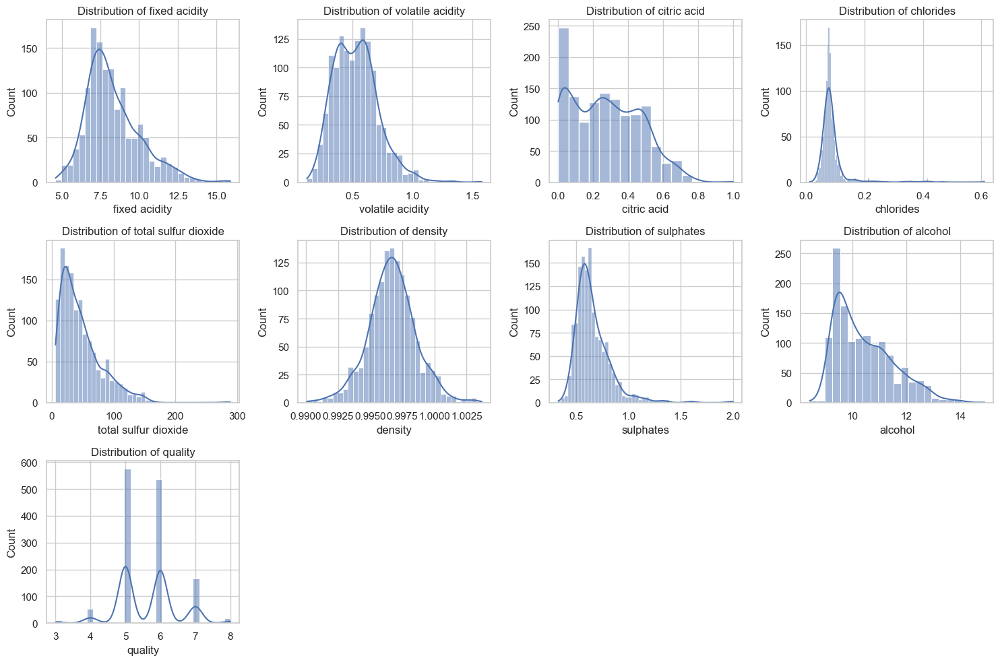

In [67]:
# Configurar el estilo de los gráficos
sns.set(style="whitegrid")

# Graficar histogramas para cada característica
plt.figure(figsize=(15, 10))
for i, column in enumerate(df.columns[:-1], 1): 
    plt.subplot(3, 4, i)
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
plt.tight_layout()
plt.show()

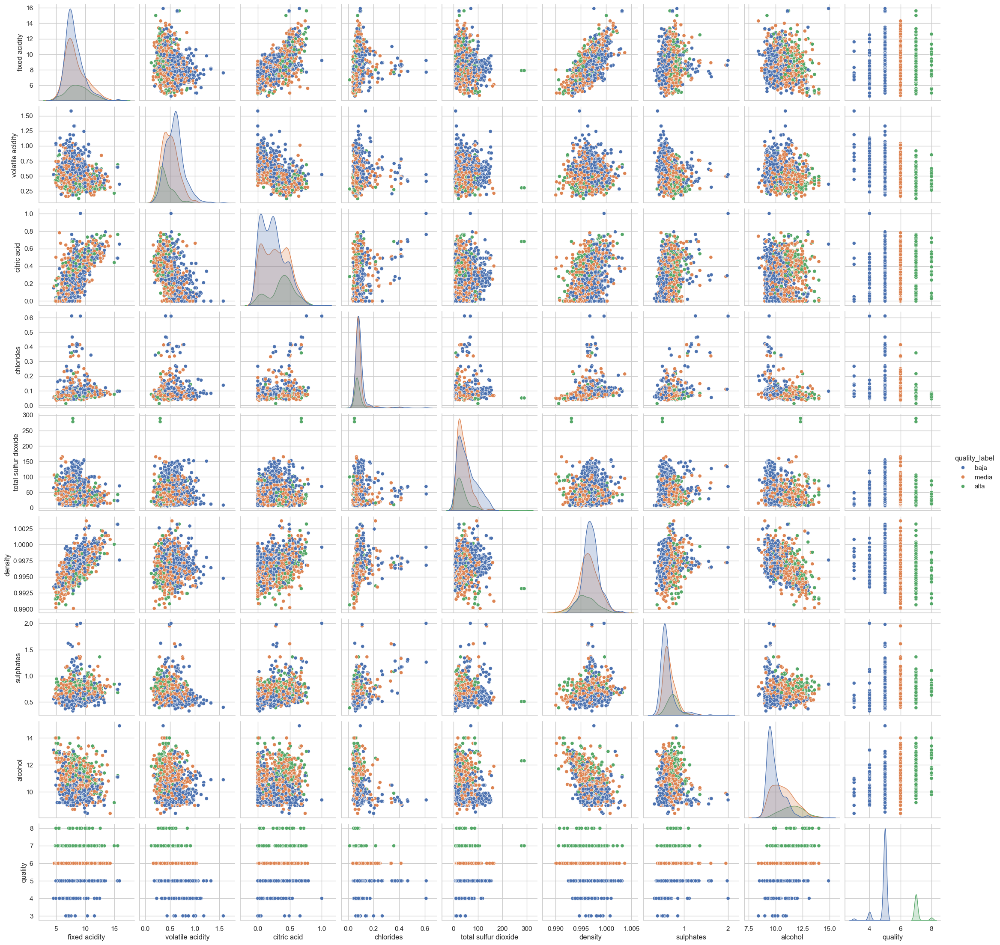

In [68]:
# Pairplot de las columnas seleccionadas
sns.pairplot(df, hue='quality_label')
plt.show()

In [70]:
import os

# Ruta completa donde guardar el archivo
ruta_archivo = "../data/processed/vinotinto.csv"

# Crear la carpeta si no existe
os.makedirs(os.path.dirname(ruta_archivo), exist_ok=True)

# Guardar el DataFrame como CSV
df.to_csv(ruta_archivo, index=False)

Utilizaremos 5 modelos supervisados para predecir la variable quality_label.

Regresión Logística

Árbol de Decisión

Random Forest

Support Vector Machine (SVM)

K-Nearest Neighbors (KNN)

Para el modelo no supervisado, aplicaremos K-Means clustering para encontrar patrones o grupos en los datos sin usar la variable objetivo quality_label.

Pero eso lo continuaremos en el notebook 02_Modelos.ipynb